In [1]:
#残務
#　本当は地域とカテゴリーのマトリックスの偏りも見ておいたほうがよい

%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import SGDClassifier, LinearRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss, accuracy_score, confusion_matrix, precision_recall_fscore_support, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelBinarizer
from sklearn.svm import SVC
from sklearn.externals.six import StringIO
import graphviz
import pydotplus
from IPython.display import Image
#from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import datetime
import codecs

C:\Users\Jun Matsunaga\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [2]:
#グラフ描画関数
def dataplot_func(pltdata):
    fig = plt.figure(figsize = (20,15))
    
    ax1 = fig.add_subplot(2,3,1)
    ax1.set_title('Goal Amount')
    ax1.hist(pltdata['usd_goal_real'].values, density=True, bins=20)
    
    ax2 = fig.add_subplot(2,3,2)
    ax2.set_title('Funding Span')
    ax2.hist(pltdata['funding_span'].values, density=True)
    
    ax3 = fig.add_subplot(2,3,3)
    ax3.set_title('Daily Target')
    ax3.hist(pltdata['daily_goal'].values, density=True, bins=20)
    
    ax4 = fig.add_subplot(2,3,4)
    ax4.set_title('Currency')
    pltdata.groupby('currency')['state'].mean().plot.barh(ax=ax4)
    
    ax5 = fig.add_subplot(2,3,5)
    ax5.set_title('County')
    pltdata.groupby('country')['state'].mean().plot.barh(ax=ax5)
    
    ax6 = fig.add_subplot(2,3,6)
    ax6.set_title('Main Category')
    pltdata.groupby('main_category')['state'].mean().plot.barh(ax=ax6)
    
    print (pltdata.groupby('currency')['state'].mean().sort_values(ascending=False))
    print (pltdata.groupby('country')['state'].mean().sort_values(ascending=False))
    print (pltdata.groupby('main_category')['state'].mean().sort_values(ascending=False))
    
    plt.show()

def scatter_matrix(pltdata):
    pltdata2 = pltdata.copy()
    pltdata2.drop(['ID', 'name', 'category', 'deadline', 'launched', 'country'], axis=1)
    pd.plotting.scatter_matrix(pltdata2, figsize=(20,20))
    plt.show()

def vs_y_dataplot_func(pltdata):
    y_plt = pltdata['state'].values
    
    fig = plt.figure(figsize = (20,10))
    #sns.set()
    #sns.set_style('whitegrid')
    #sns.set_palette('gray')
    
    SF_flag = y_plt.astype(np.bool)
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.set_title('Goal Amount')
    ax1.set_xlabel("Success Flag")
    ax1.set_ylabel("Goal Amount")
    ax1.set_xticklabels(['Successful', 'Failed'])
    ax1.set_xticks([1, 2])
    x = pltdata['usd_goal_real'].values
    ax1.violinplot([x[SF_flag],x[~SF_flag]])
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Funding Span')
    ax2.set_xlabel("Success Flag")
    ax2.set_ylabel("Funding Span")
    ax2.set_xticklabels(['Successful', 'Failed'])
    ax2.set_xticks([1, 2])
    x = pltdata['funding_span'].values
    ax2.violinplot([x[SF_flag],x[~SF_flag]])
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Daily Target')
    ax3.set_xlabel("Success Flag")
    ax3.set_ylabel("Daily Target")
    ax3.set_xticklabels(['Successful', 'Failed'])
    ax3.set_xticks([1, 2])
    x = pltdata['daily_goal'].values
    ax3.violinplot([x[SF_flag],x[~SF_flag]])
    
    plt.show()

#外れ値処理関数
def outlier_remove_func(dataframe):
    mask = ((dataframe['usd_goal_real'] < dataframe['usd_goal_real'].quantile(0.95)) & (dataframe['funding_span'] < dataframe['funding_span'].quantile(0.99)))
    dataframe_ex_outlier = dataframe[mask]
    lb = LabelBinarizer()
    main_category_onehot = lb.fit_transform(dataframe_ex_outlier['main_category'])
    main_category_list = lb.classes_
    dataframe_ex_outlier.reset_index(inplace=True, drop=True)
    return dataframe_ex_outlier, main_category_onehot, main_category_list
def outlier2_remove_func(dataframe):
    mask = (dataframe['pledged_ratio'] < dataframe['pledged_ratio'].quantile(0.90))
    dataframe_ex_outlier = dataframe[mask]
    dataframe_ex_outlier.reset_index(inplace=True, drop=True)
    dataframe_ex_outlier2, main_category_onehot, main_category_list = outlier_remove_func(dataframe_ex_outlier)
    return dataframe_ex_outlier2, main_category_onehot, main_category_list


,ID,name,category,main_category,currency,deadline,goal,launched,pledged,state,backers,country,usd pledged,usd_pledged_real,usd_goal_real
0,1000002330,The Songs of Adelaide & Abullah,Poetry,Publishing,GBP,2015/10/9,1000.0,2015/8/11 12:12,0.0,failed,0,GB,0.0,0.0,1533.95
1,1000003930,Greeting From Earth: ZGAC Arts Capsule For ET,Narrative Film,Film & Video,USD,2017/11/1,30000.0,2017/9/2 4:43,2421.0,failed,15,US,100.0,2421.0,30000.00
2,1000004038,Where is Hank?,Narrative Film,Film & Video,USD,2013/2/26,45000.0,2013/1/12 0:20,220.0,failed,3,US,220.0,220.0,45000.00
3,1000007540,ToshiCapital Rekordz Needs Help to Complete Album,Music,Music,USD,2012/4/16,5000.0,2012/3/17 3:24,1.0,failed,1,US,1.0,1.0,5000.00
4,1000011046,Community Film Project: The Art of Neighborhoo...,Film & Video,Film & Video,USD,2015/8/29,19500.0,2015/7/4 8:35,1283.0,canceled,14,US,1283.0,1283.0,19500.00


Original Size = 378376

ex. live & undefined Size = 372020



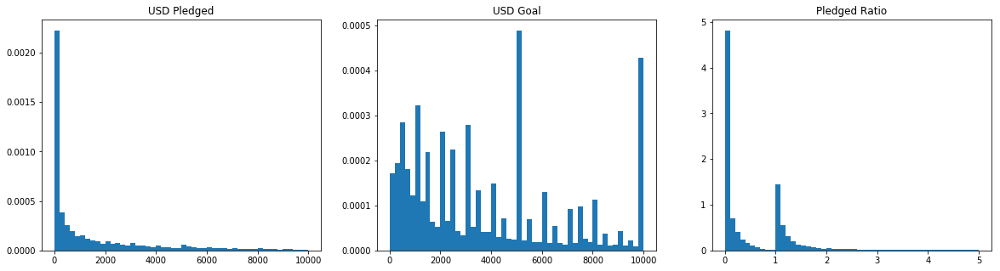

                        ID      goal   pledged     state   backers  \
ID                1.000000  0.001661  0.000459 -0.001010  0.000672   
goal              0.001661  1.000000  0.007311 -0.024817  0.004035   
pledged           0.000459  0.007311  1.000000  0.111594  0.717382   
state            -0.001010 -0.024817  0.111594  1.000000  0.128744   
backers           0.000672  0.004035  0.717382  0.128744  1.000000   
usd pledged      -0.000625  0.005599  0.858141  0.097577  0.697727   
usd_pledged_real -0.000056  0.005145  0.953363  0.110538  0.752450   
usd_goal_real     0.001822  0.941676  0.005072 -0.023563  0.004544   
pledged_ratio    -0.000822 -0.000475  0.008635  0.014753  0.016590   
currency_usdflag  0.002019 -0.008836 -0.001245  0.062986  0.013076   
funding_span      0.002131  0.023227  0.006450 -0.118303 -0.001631   
daily_goal        0.001307  0.312536  0.000843 -0.005888  0.000761   

                  usd pledged  usd_pledged_real  usd_goal_real  pledged_ratio  \
ID      

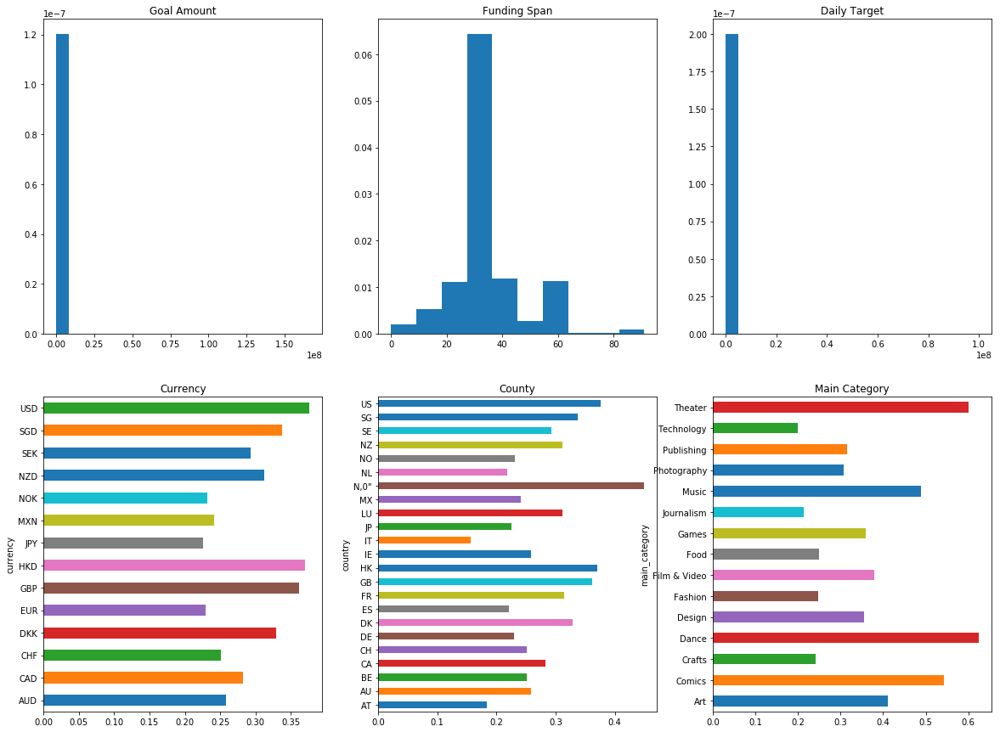

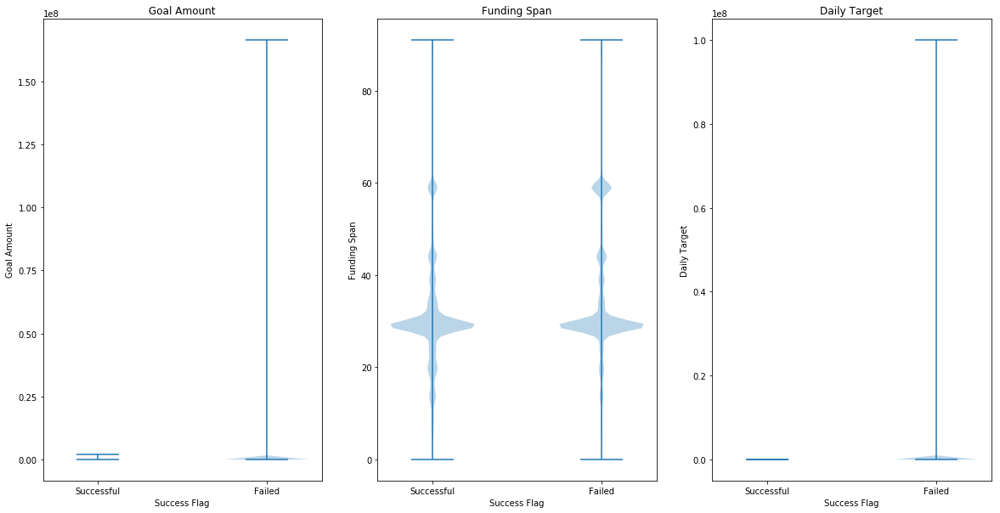

In [3]:
#カテゴリー、通貨、国、ゴールの大きさ、ローンチ、デッドライン　くらいしか事前推定の要素として使えない。
#ローンチからデッドラインまでの日数は有効かもしれない。またゴールをその日数で割るというのも、1日あたりの獲得金額を表現でき、有効かもしれない。

#df_deals = pd.read_csv("./kickstarter-projects/ks-projects-201801_short.csv")[['ID', 'name', 'category', 'main_category', 'currency', 'deadline', 'goal', 'launched', 'pledged', 'state', 'backers', 'country', 'usd pledged', 'usd_pledged_real', 'usd_goal_real']]
#df_deals = pd.read_csv("./kickstarter-projects/ks-projects-201801.csv")[['ID', 'name', 'category', 'main_category', 'currency', 'deadline', 'goal', 'launched', 'pledged', 'state', 'backers', 'country', 'usd pledged', 'usd_pledged_real', 'usd_goal_real']]
#下記はよくわかっていないながらも、ググって出てきた手法で、エンコードがらみのファイル読み込みエラーを解消（一度エクセルでバグ行を取り除いたことでエンコードがらみがおかしくなった。なお外れ値処理ではない。あくまで物理的破損行の除去のみ。）
with codecs.open("./kickstarter-projects/ks-projects-201801_bugcut_SJIS.csv", "r", "Shift-JIS", "ignore") as file:
    df_deals = pd.read_table(file, delimiter=",")
display(df_deals.head())
data_records_count = len(df_deals)
print ("Original Size = " + str(data_records_count))
print ()

#目的変数の整理
#　stateでliveとundefinedは分析対象外とする。その他については、successful以外はfailed扱いとして、二値分類問題とする。
mask = ((df_deals['state'] == 'live') | (df_deals['state'] == 'undefined'))
df_deals = df_deals[~mask]
df_deals.reset_index(inplace=True, drop=True)
data_records_count = len(df_deals)
print ("ex. live & undefined Size = " + str(data_records_count))
print ()
#　stateをフラグ化
df_deals['state'] = (df_deals['state'] == 'successful')*1
#　達成率を生成（回帰分析で使用）
df_deals['pledged_ratio'] = df_deals['usd_pledged_real'] / df_deals['usd_goal_real']

#説明変数の整理
#　CurrencyをUSD or notでフラグ化
df_deals['currency_usdflag'] = (df_deals['currency'] == 'USD')*1
#　main_categoryをOne Hot Dataへ
lb = LabelBinarizer()
main_category_onehot = lb.fit_transform(df_deals['main_category'])
#　ローンチからデッドラインまでの日数、および1日あたり目標金額を計算し新たな説明変数へ
df_deals['launched_dt'] = pd.to_datetime(df_deals.launched)
df_deals['deadline_dt'] = pd.to_datetime(df_deals.deadline)
df_deals['funding_span'] = (df_deals.deadline_dt - df_deals.launched_dt).dt.days
df_deals['daily_goal'] = df_deals.usd_goal_real / (df_deals.funding_span + 1)

#仕上がったデータセット（外れ値対応前）をまずは描画
#　実はおかしかった達成率の分布・・・
fig = plt.figure(figsize = (20,5))
ax1 = fig.add_subplot(1,3,1)
ax1.hist(df_deals['usd_pledged_real'].values, density=True, bins=50, range=(0,10000))
ax1.set_title('USD Pledged')
ax2 = fig.add_subplot(1,3,2)
ax2.hist(df_deals['usd_goal_real'].values, density=True, bins=50, range=(0,10000))
ax2.set_title('USD Goal')
ax3 = fig.add_subplot(1,3,3)
ax3.hist(df_deals['pledged_ratio'].values, density=True, bins=50, range=(0,5))
ax3.set_title('Pledged Ratio')
plt.show()
#　単純な分布確認
print (df_deals.corr())
dataplot_func(df_deals)
#scatter_matrix(df_deals)
#　Statusとの相関性確認
vs_y_dataplot_func(df_deals)


314764
                        ID      goal   pledged     state   backers  \
ID                1.000000  0.000192 -0.000154 -0.000269 -0.000218   
goal              0.000192  1.000000  0.331585 -0.086170  0.097166   
pledged          -0.000154  0.331585  1.000000  0.313599  0.542612   
state            -0.000269 -0.086170  0.313599  1.000000  0.397117   
backers          -0.000218  0.097166  0.542612  0.397117  1.000000   
usd pledged      -0.001787  0.124717  0.615105  0.399924  0.708924   
usd_pledged_real -0.000191  0.148544  0.705689  0.434699  0.767912   
usd_goal_real    -0.000039  0.467863  0.244043 -0.167700  0.230425   
pledged_ratio     0.000005 -0.092062  0.340950  0.951164  0.440567   
currency_usdflag  0.001201 -0.084952 -0.019480  0.074274  0.034488   
funding_span      0.000782  0.065397  0.008814 -0.093898 -0.010774   
daily_goal       -0.000023  0.382657  0.203643 -0.135403  0.198684   

                  usd pledged  usd_pledged_real  usd_goal_real  pledged_ratio  \
I

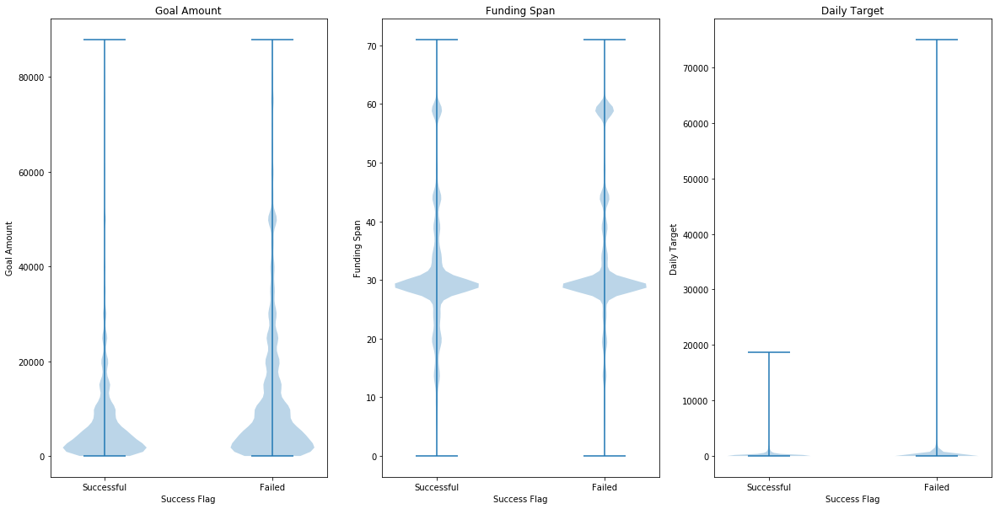

In [4]:
#外れ値を一旦除去して再確認
#print (df_deals['goal'].quantile(0.95))
#print (df_deals['funding_span'].quantile(0.99))
#print (df_deals['pledged_ratio'].quantile(0.90))
df_deals_ex_outlier, main_category_onehot, main_category_list = outlier2_remove_func(df_deals)
data_records_count = len(df_deals_ex_outlier)
print (data_records_count)

print (df_deals_ex_outlier.corr())
vs_y_dataplot_func(df_deals_ex_outlier)


In [5]:
#ロジスティック回帰

n_split = 5
sum_logloss = 0
sum_accuracy = 0
sum_precision = 0
sum_recall = 0
sum_f1_score = 0
split_num = 1

results_fold = np.zeros((n_split, 19))
display_results_column = np.array([])
display_results_index = ["w0","w1(Funding Span)","w2(Daily Goal)","w3(USD)"]
lb = LabelBinarizer()
stdsc = StandardScaler()
clf = SGDClassifier(loss='log', penalty='none', max_iter=100, fit_intercept=True, random_state=1234)

for train_idx, test_idx in KFold(n_splits=n_split, random_state=1234).split(df_deals):
    train_temp = df_deals.loc[train_idx]
    test_temp = df_deals.loc[test_idx]
    #Trainデータのみ外れ値処理
    df_deals_ex_outlier, main_category_onehot, main_category_list = outlier_remove_func(train_temp)
    
    #Trainデータをベースに標準化
    funding_span_train = df_deals_ex_outlier['funding_span'].values.reshape(-1,1)
    daily_goal_train = df_deals_ex_outlier['daily_goal'].values.reshape(-1,1)
    funding_span_test = test_temp['funding_span'].values.reshape(-1,1)
    daily_goal_test = test_temp['daily_goal'].values.reshape(-1,1)
    funding_span_train_stdsc = stdsc.fit_transform(funding_span_train)
    funding_span_test_stdsc = stdsc.transform(funding_span_test)
    daily_goal_train_stdsc = stdsc.fit_transform(daily_goal_train)
    daily_goal_test_stdsc = stdsc.transform(daily_goal_test)
    
    y_train = df_deals_ex_outlier['state'].values
    X_train = np.c_[funding_span_train_stdsc, daily_goal_train_stdsc, df_deals_ex_outlier['currency_usdflag'].values.reshape(-1,1), main_category_onehot]
    y_test = test_temp['state'].values
    main_category_onehot_test = lb.fit_transform(test_temp['main_category'])
    X_test = np.c_[funding_span_test_stdsc, daily_goal_test_stdsc, test_temp['currency_usdflag'].values.reshape(-1,1), main_category_onehot_test]
    
    clf.fit(X_train, y_train)
    print ("w0 = {:.3f}".format(clf.intercept_[0]))
    print ("w1(Funding Span) = {:.3f}".format(clf.coef_[0,0]))
    print ("w2(Daily Goal) = {:.3f}".format(clf.coef_[0,1]))
    print ("w3(USD) = {:.3f}".format(clf.coef_[0,2]))
    results_temp = [clf.intercept_[0],clf.coef_[0,0],clf.coef_[0,1],clf.coef_[0,2]]
    for i in range(len(X_train[0])-3):
        print ("w"+str(i+4)+"("+main_category_list[i]+") = {:.3f}".format(clf.coef_[0,i+3]))
        results_temp = np.hstack((results_temp, clf.coef_[0,i+3]))
        if split_num == 1:
            display_results_index = np.hstack((display_results_index, ("w"+str(i+4)+"("+main_category_list[i]+")")))
    y_test_est = clf.predict(X_test)
    logloss_fold = - log_loss(y_test, y_test_est)
    accuracy_fold = 100 * accuracy_score(y_test, y_test_est)
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test,y_test_est)
    print('対数尤度 = {:.3f}'.format(logloss_fold))
    print('正答率 = {:.3f}%'.format(accuracy_fold))
    print('適合率 = {:.3f}%'.format(100 * precision[0]))
    print('再現率 = {:.3f}%'.format(100 * recall[0]))
    print('F1値 = {:.3f}%'.format(100 * f1_score[0]))
    conf_mat = pd.DataFrame(confusion_matrix(y_test, y_test_est,labels=[1,0]), 
                        index=['正解 = 調達成功', '正解 = 調達失敗'], 
                        columns=['予測 = 調達成功', '予測 = 調達失敗'])
    display(conf_mat)
    
    print("Fold %s Done"%split_num)
    print()
    
    display_results_column = np.hstack((display_results_column, ("Fold "+str(split_num))))
    results_fold[split_num-1] = results_temp
    sum_logloss += logloss_fold
    sum_accuracy += accuracy_fold
    sum_precision += 100 * precision[0]
    sum_recall += 100 * recall[0]
    sum_f1_score += 100 * f1_score[0]
    split_num += 1

mean_logloss = sum_logloss / n_split
mean_accuracy = sum_accuracy / n_split
mean_precision = sum_precision / n_split
mean_recall = sum_recall / n_split
mean_f1_score = sum_f1_score / n_split
print("Cross Validation Log_Loss = {:.3f}".format(mean_logloss))
print("Cross Validation Accuracy = {:.3f}%".format(mean_accuracy))
print("Cross Validation Precision = {:.3f}%".format(mean_precision))
print("Cross Validation Recall = {:.3f}%".format(mean_recall))
print("Cross Validation F1 Score = {:.3f}%".format(mean_f1_score))


C:\Users\Jun Matsunaga\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


w0 = -0.748
w1(Funding Span) = -0.275
w2(Daily Goal) = -0.447
w3(USD) = 0.229
w4(Art) = 0.025
w5(Comics) = 0.605
w6(Crafts) = -0.801
w7(Dance) = 0.905
w8(Design) = 0.108
w9(Fashion) = -0.606
w10(Film & Video) = 0.131
w11(Food) = -0.440
w12(Games) = 0.038
w13(Journalism) = -0.782
w14(Music) = 0.419
w15(Photography) = -0.381
w16(Publishing) = -0.318
w17(Technology) = -0.540
w18(Theater) = 0.889
対数尤度 = -11.402
正答率 = 66.987%
適合率 = 68.124%
再現率 = 90.443%
F1値 = 77.713%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,7017,20038
正解 = 調達失敗,4525,42824


Fold 1 Done

w0 = -0.727
w1(Funding Span) = -0.286
w2(Daily Goal) = -0.431
w3(USD) = 0.271
w4(Art) = 0.038
w5(Comics) = 0.627
w6(Crafts) = -0.818
w7(Dance) = 0.915
w8(Design) = 0.100
w9(Fashion) = -0.602
w10(Film & Video) = 0.139
w11(Food) = -0.431
w12(Games) = 0.049
w13(Journalism) = -0.803
w14(Music) = 0.427
w15(Photography) = -0.383
w16(Publishing) = -0.331
w17(Technology) = -0.531
w18(Theater) = 0.876
対数尤度 = -11.360
正答率 = 67.111%
適合率 = 69.154%
再現率 = 87.755%
F1値 = 77.352%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,8143,18640
正解 = 調達失敗,5831,41790


Fold 2 Done

w0 = -0.745
w1(Funding Span) = -0.292
w2(Daily Goal) = -0.422
w3(USD) = 0.264
w4(Art) = 0.032
w5(Comics) = 0.614
w6(Crafts) = -0.814
w7(Dance) = 0.926
w8(Design) = 0.103
w9(Fashion) = -0.616
w10(Film & Video) = 0.146
w11(Food) = -0.442
w12(Games) = 0.032
w13(Journalism) = -0.791
w14(Music) = 0.398
w15(Photography) = -0.384
w16(Publishing) = -0.334
w17(Technology) = -0.517
w18(Theater) = 0.902
対数尤度 = -11.383
正答率 = 67.042%
適合率 = 68.887%
再現率 = 88.733%
F1値 = 77.560%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,7503,19141
正解 = 調達失敗,5381,42379


Fold 3 Done

w0 = -0.733
w1(Funding Span) = -0.289
w2(Daily Goal) = -0.457
w3(USD) = 0.278
w4(Art) = 0.027
w5(Comics) = 0.613
w6(Crafts) = -0.802
w7(Dance) = 0.921
w8(Design) = 0.096
w9(Fashion) = -0.603
w10(Film & Video) = 0.150
w11(Food) = -0.444
w12(Games) = 0.042
w13(Journalism) = -0.791
w14(Music) = 0.431
w15(Photography) = -0.387
w16(Publishing) = -0.332
w17(Technology) = -0.546
w18(Theater) = 0.891
対数尤度 = -11.338
正答率 = 67.172%
適合率 = 69.346%
再現率 = 87.324%
F1値 = 77.303%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,8384,18387
正解 = 調達失敗,6038,41595


Fold 4 Done

w0 = -0.738
w1(Funding Span) = -0.308
w2(Daily Goal) = -0.455
w3(USD) = 0.255
w4(Art) = 0.050
w5(Comics) = 0.599
w6(Crafts) = -0.796
w7(Dance) = 0.917
w8(Design) = 0.114
w9(Fashion) = -0.619
w10(Film & Video) = 0.138
w11(Food) = -0.452
w12(Games) = 0.047
w13(Journalism) = -0.795
w14(Music) = 0.406
w15(Photography) = -0.380
w16(Publishing) = -0.330
w17(Technology) = -0.514
w18(Theater) = 0.876
対数尤度 = -11.247
正答率 = 67.437%
適合率 = 69.273%
再現率 = 88.638%
F1値 = 77.768%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,7801,18796
正解 = 調達失敗,5432,42375


Fold 5 Done

Cross Validation Log_Loss = -11.346
Cross Validation Accuracy = 67.150%
Cross Validation Precision = 68.957%
Cross Validation Recall = 88.579%
Cross Validation F1 Score = 77.539%


In [ ]:
#SVM

n_split = 5
sum_logloss = 0
sum_accuracy = 0
sum_precision = 0
sum_recall = 0
sum_f1_score = 0
sum_score = 0
split_num = 1

lb = LabelBinarizer()
stdsc = StandardScaler()

for train_idx, test_idx in KFold(n_splits=n_split, random_state=1234).split(df_deals):
    train_temp = df_deals.loc[train_idx]
    test_temp = df_deals.loc[test_idx]
    #Trainデータのみ外れ値処理
    df_deals_ex_outlier, main_category_onehot, main_category_list = outlier_remove_func(train_temp)
    
    #Trainデータをベースに標準化
    funding_span_train = df_deals_ex_outlier['funding_span'].values.reshape(-1,1)
    daily_goal_train = df_deals_ex_outlier['daily_goal'].values.reshape(-1,1)
    funding_span_test = test_temp['funding_span'].values.reshape(-1,1)
    daily_goal_test = test_temp['daily_goal'].values.reshape(-1,1)
    funding_span_train_stdsc = stdsc.fit_transform(funding_span_train)
    funding_span_test_stdsc = stdsc.transform(funding_span_test)
    daily_goal_train_stdsc = stdsc.fit_transform(daily_goal_train)
    daily_goal_test_stdsc = stdsc.transform(daily_goal_test)
    
    y_train = df_deals_ex_outlier['state'].values
    X_train = np.c_[funding_span_train_stdsc, daily_goal_train_stdsc, df_deals_ex_outlier['currency_usdflag'].values.reshape(-1,1), main_category_onehot]
    y_test = test_temp['state'].values
    main_category_onehot_test = lb.fit_transform(test_temp['main_category'])
    X_test = np.c_[funding_span_test_stdsc, daily_goal_test_stdsc, test_temp['currency_usdflag'].values.reshape(-1,1), main_category_onehot_test]
    
    #parameters = {'kernel':['linear', 'rbf'], 'C':[1, 5]}
    parameters = {'kernel': 'rbf', 'C': 5}
    #model = SVC()
    #clf2_1 = GridSearchCV(model, parameters, cv=3,)
    #clf2_1.fit(X_train, y_train)
    #print(clf2_1.best_params_, clf2_1.best_score_)
    #clf2_2 = SVC(**clf2_1.best_params_)
    clf2_2 = SVC(kernel='rbf', C=5)
    clf2_2.fit(X_train, y_train)
    score_fold = 100 * clf2_2.score(X_test, y_test)
    print('識別精度 = {:.3f}'.format(score_fold))
    
    print("Fold %s Done"%split_num)
    print()
    
    sum_score += score_fold
    split_num += 1

mean_score = sum_score / n_split
print("Cross Validation Score = {:.3f}".format(mean_score))


C:\Users\Jun Matsunaga\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


識別精度 = 66.514
Fold 1 Done

識別精度 = 66.500
Fold 2 Done



In [6]:
#pledged/goal=達成率予測回帰モデル

n_split = 5
sum_mse = 0
sum_accuracy = 0
sum_precision = 0
sum_recall = 0
sum_f1_score = 0
split_num = 1

results_fold = np.zeros((n_split, 19))
display_results_column = np.array([])
display_results_index = ["w0","w1(Funding Span)","w2(Daily Goal)","w3(USD)"]
lb = LabelBinarizer()
stdsc = StandardScaler()
regr = LinearRegression(fit_intercept=False)

for train_idx, test_idx in KFold(n_splits=n_split, random_state=1234).split(df_deals):
    train_temp = df_deals.loc[train_idx]
    test_temp = df_deals.loc[test_idx]
    #Trainデータのみ外れ値処理
    df_deals_ex_outlier, main_category_onehot, main_category_list = outlier2_remove_func(train_temp)
    
    #Trainデータをベースに標準化
    funding_span_train = df_deals_ex_outlier['funding_span'].values.reshape(-1,1)
    daily_goal_train = df_deals_ex_outlier['daily_goal'].values.reshape(-1,1)
    funding_span_test = test_temp['funding_span'].values.reshape(-1,1)
    daily_goal_test = test_temp['daily_goal'].values.reshape(-1,1)
    funding_span_train_stdsc = stdsc.fit_transform(funding_span_train)
    funding_span_test_stdsc = stdsc.transform(funding_span_test)
    daily_goal_train_stdsc = stdsc.fit_transform(daily_goal_train)
    daily_goal_test_stdsc = stdsc.transform(daily_goal_test)
    
    y_train = df_deals_ex_outlier['pledged_ratio'].values
    X_train = np.c_[funding_span_train_stdsc, daily_goal_train_stdsc, df_deals_ex_outlier['currency_usdflag'].values.reshape(-1,1), main_category_onehot]
    y_test = test_temp['pledged_ratio'].values
    y_test_state = test_temp['state'].values
    main_category_onehot_test = lb.fit_transform(test_temp['main_category'])
    X_test = np.c_[funding_span_test_stdsc, daily_goal_test_stdsc, test_temp['currency_usdflag'].values.reshape(-1,1), main_category_onehot_test]
    
    regr.fit(X_train, y_train)
    print ("w0 = {:.3f}".format(regr.intercept_))
    print ("w1(Funding Span) = {:.3f}".format(regr.coef_[0]))
    print ("w2(Daily Goal) = {:.3f}".format(regr.coef_[1]))
    print ("w3(USD) = {:.3f}".format(regr.coef_[2]))
    results_temp = [regr.intercept_,regr.coef_[0],regr.coef_[1],regr.coef_[2]]
    for i in range(len(X_train[0])-3):
        print ("w"+str(i+4)+"("+main_category_list[i]+") = {:.3f}".format(regr.coef_[i+3]))
        results_temp = np.hstack((results_temp, regr.coef_[i+3]))
        if split_num == 1:
            display_results_index = np.hstack((display_results_index, ("w"+str(i+4)+"("+main_category_list[i]+")")))
    y_test_est = regr.predict(X_test)
    #　次の式の閾値設定は目標達成率100%を意味する1であるべきだが、実際には回帰の結果が1を超えてこないことにより、成功と予想できなくなる。
    #　意味は崩れるが閾値を0.5などにしてみると正答率はロジスティック回帰並みにはなるが、決して優秀にはならない。
    #　そもそも達成率の分布が異様な形となっているのがあやしい。。。
    y_test_state_est = (y_test_est >= 0.5)*1
    mse_fold = mean_squared_error(y_test, y_test_est)
    accuracy_fold = 100 * accuracy_score(y_test_state, y_test_state_est)
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test_state,y_test_state_est)
    print('MSE = {:.3f}'.format(mse_fold))
    print('R^2_Score = {:.3f}'.format(r2_score(y_test,y_test_est)))
    print('正答率 = {:.3f}%'.format(accuracy_fold))
    print('適合率 = {:.3f}%'.format(100 * precision[0]))
    print('再現率 = {:.3f}%'.format(100 * recall[0]))
    print('F1値 = {:.3f}%'.format(100 * f1_score[0]))
    conf_mat = pd.DataFrame(confusion_matrix(y_test_state, y_test_state_est,labels=[1,0]), 
                        index=['正解 = 調達成功', '正解 = 調達失敗'], 
                        columns=['予測 = 調達成功', '予測 = 調達失敗'])
    display(conf_mat)
    
    print("Fold %s Done"%split_num)
    print()
    
    display_results_column = np.hstack((display_results_column, ("Fold "+str(split_num))))
    results_fold[split_num-1] = results_temp
    sum_mse += mse_fold
    sum_accuracy += accuracy_fold
    sum_precision += 100 * precision[0]
    sum_recall += 100 * recall[0]
    sum_f1_score += 100 * f1_score[0]
    split_num += 1

mean_mse = sum_mse / n_split
mean_accuracy = sum_accuracy / n_split
mean_precision = sum_precision / n_split
mean_recall = sum_recall / n_split
mean_f1_score = sum_f1_score / n_split
print("Cross Validation MSE = {:.3f}".format(mean_mse))
print("Cross Validation Accuracy = {:.3f}%".format(mean_accuracy))
print("Cross Validation Precision = {:.3f}%".format(mean_precision))
print("Cross Validation Recall = {:.3f}%".format(mean_recall))
print("Cross Validation F1 Score = {:.3f}%".format(mean_f1_score))


C:\Users\Jun Matsunaga\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


w0 = 0.000
w1(Funding Span) = -0.060
w2(Daily Goal) = -0.062
w3(USD) = 0.054
w4(Art) = 0.397
w5(Comics) = 0.516
w6(Crafts) = 0.180
w7(Dance) = 0.645
w8(Design) = 0.350
w9(Fashion) = 0.236
w10(Film & Video) = 0.428
w11(Food) = 0.282
w12(Games) = 0.304
w13(Journalism) = 0.210
w14(Music) = 0.507
w15(Photography) = 0.299
w16(Publishing) = 0.302
w17(Technology) = 0.211
w18(Theater) = 0.641
MSE = 15336.472
R^2_Score = -0.117
正答率 = 66.263%
適合率 = 70.428%
再現率 = 80.994%
F1値 = 75.342%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,10952,16103
正解 = 調達失敗,8999,38350


Fold 1 Done

w0 = 0.000
w1(Funding Span) = -0.060
w2(Daily Goal) = -0.064
w3(USD) = 0.055
w4(Art) = 0.394
w5(Comics) = 0.517
w6(Crafts) = 0.175
w7(Dance) = 0.651
w8(Design) = 0.351
w9(Fashion) = 0.239
w10(Film & Video) = 0.428
w11(Food) = 0.287
w12(Games) = 0.308
w13(Journalism) = 0.207
w14(Music) = 0.508
w15(Photography) = 0.294
w16(Publishing) = 0.302
w17(Technology) = 0.212
w18(Theater) = 0.637
MSE = 46512.238
R^2_Score = -0.001
正答率 = 66.343%
適合率 = 70.779%
再現率 = 80.752%
F1値 = 75.437%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,10907,15876
正解 = 調達失敗,9166,38455


Fold 2 Done

w0 = 0.000
w1(Funding Span) = -0.061
w2(Daily Goal) = -0.066
w3(USD) = 0.058
w4(Art) = 0.391
w5(Comics) = 0.519
w6(Crafts) = 0.174
w7(Dance) = 0.651
w8(Design) = 0.350
w9(Fashion) = 0.237
w10(Film & Video) = 0.427
w11(Food) = 0.283
w12(Games) = 0.306
w13(Journalism) = 0.205
w14(Music) = 0.504
w15(Photography) = 0.295
w16(Publishing) = 0.299
w17(Technology) = 0.213
w18(Theater) = 0.642
MSE = 73592.901
R^2_Score = -0.001
正答率 = 66.162%
適合率 = 70.829%
再現率 = 80.396%
F1値 = 75.310%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,10830,15814
正解 = 調達失敗,9363,38397


Fold 3 Done

w0 = 0.000
w1(Funding Span) = -0.060
w2(Daily Goal) = -0.064
w3(USD) = 0.059
w4(Art) = 0.393
w5(Comics) = 0.513
w6(Crafts) = 0.175
w7(Dance) = 0.647
w8(Design) = 0.347
w9(Fashion) = 0.237
w10(Film & Video) = 0.425
w11(Food) = 0.282
w12(Games) = 0.306
w13(Journalism) = 0.205
w14(Music) = 0.507
w15(Photography) = 0.293
w16(Publishing) = 0.300
w17(Technology) = 0.209
w18(Theater) = 0.637
MSE = 24927.256
R^2_Score = -0.001
正答率 = 66.103%
適合率 = 70.675%
再現率 = 80.419%
F1値 = 75.233%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,10877,15894
正解 = 調達失敗,9327,38306


Fold 4 Done

w0 = 0.000
w1(Funding Span) = -0.061
w2(Daily Goal) = -0.063
w3(USD) = 0.058
w4(Art) = 0.395
w5(Comics) = 0.517
w6(Crafts) = 0.176
w7(Dance) = 0.649
w8(Design) = 0.351
w9(Fashion) = 0.235
w10(Film & Video) = 0.426
w11(Food) = 0.281
w12(Games) = 0.305
w13(Journalism) = 0.211
w14(Music) = 0.505
w15(Photography) = 0.298
w16(Publishing) = 0.302
w17(Technology) = 0.212
w18(Theater) = 0.638
MSE = 203681.208
R^2_Score = -0.000
正答率 = 66.510%
適合率 = 71.099%
再現率 = 80.670%
F1値 = 75.583%


,予測 = 調達成功,予測 = 調達失敗
正解 = 調達成功,10920,15677
正解 = 調達失敗,9241,38566


Fold 5 Done

Cross Validation MSE = 72810.015
Cross Validation Accuracy = 66.276%
Cross Validation Precision = 70.762%
Cross Validation Recall = 80.646%
Cross Validation F1 Score = 75.381%


score(Train)= 0.7055399374215784
score(Test)= 0.6441185957744208


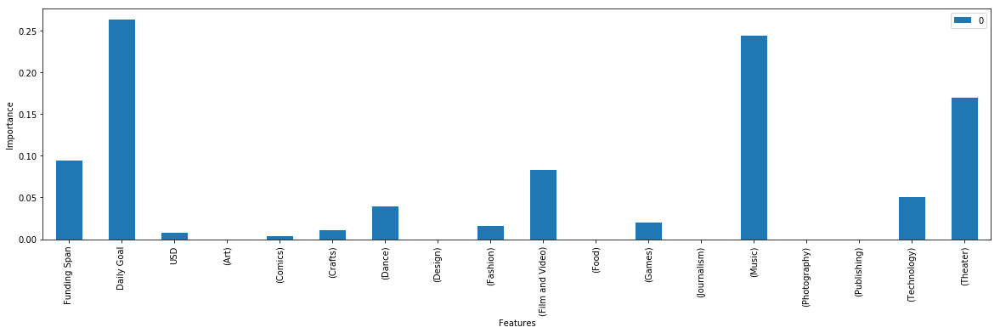

0


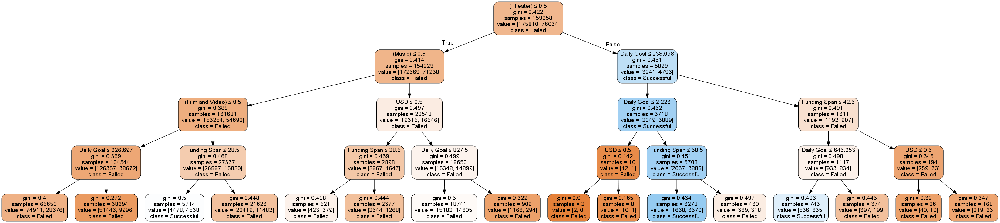

1


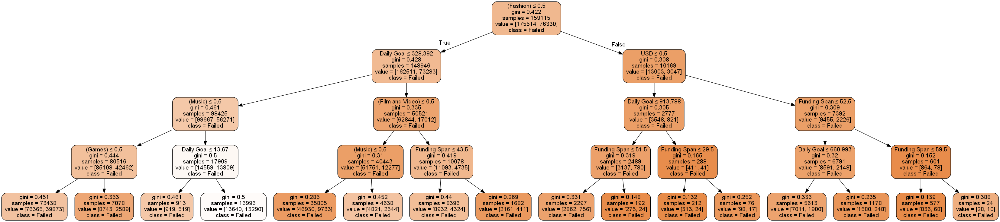

2


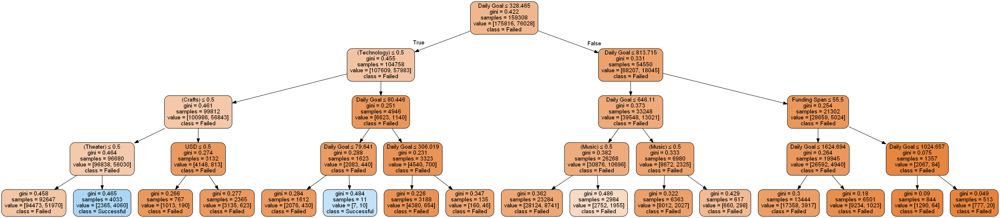

3


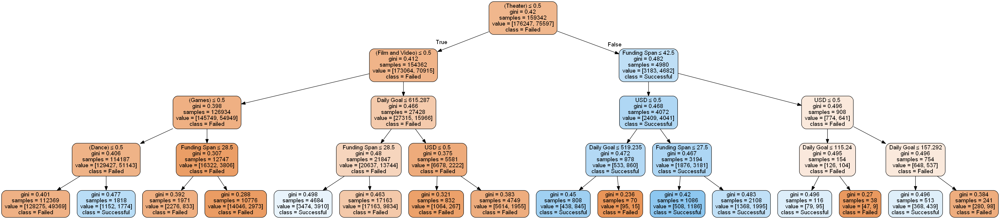

4


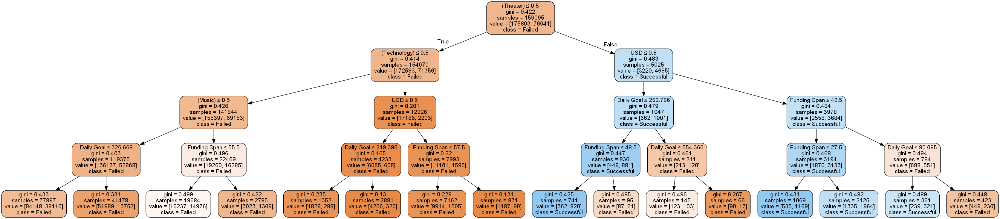

5


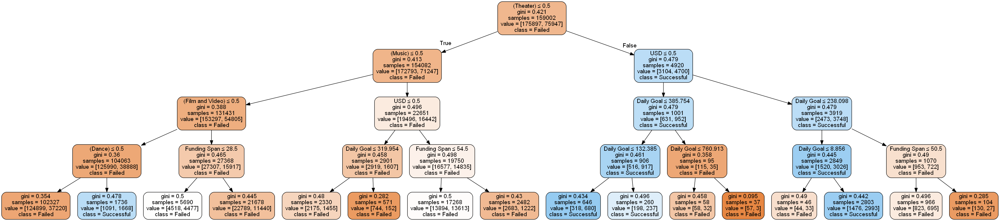

6


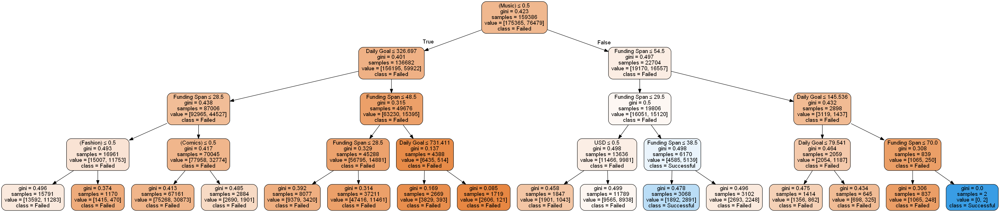

score(Train)= 0.7046873262703115
score(Test)= 0.6479490349981184


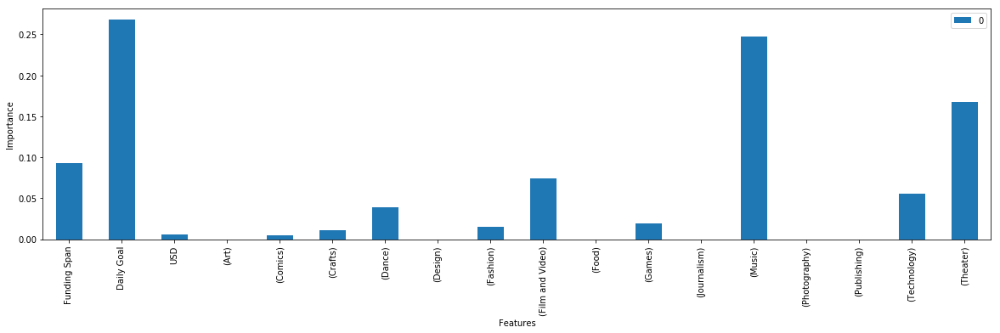

0


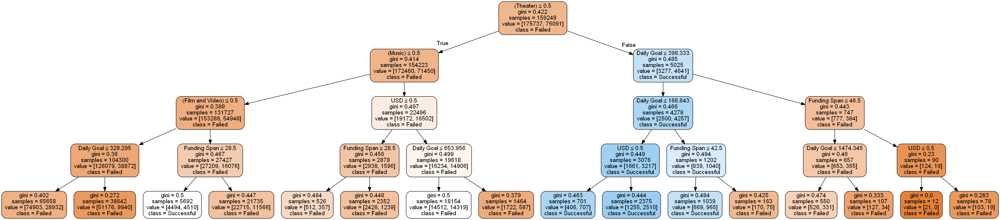

1


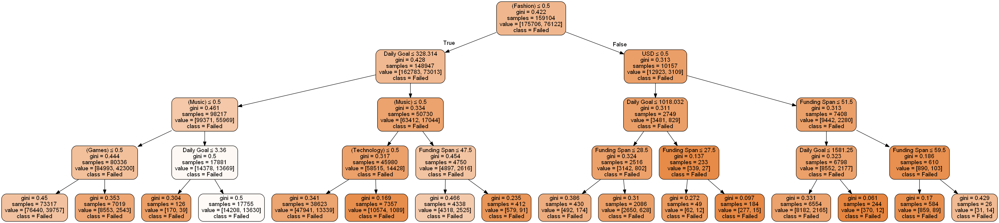

2


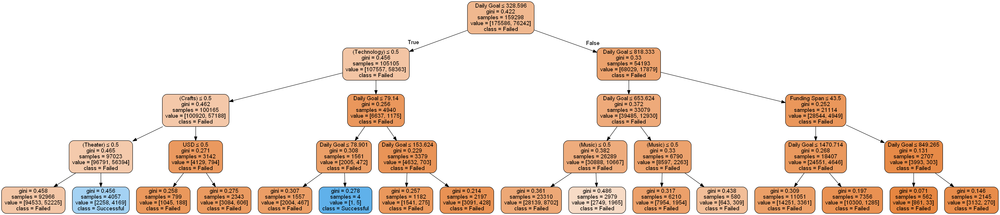

3


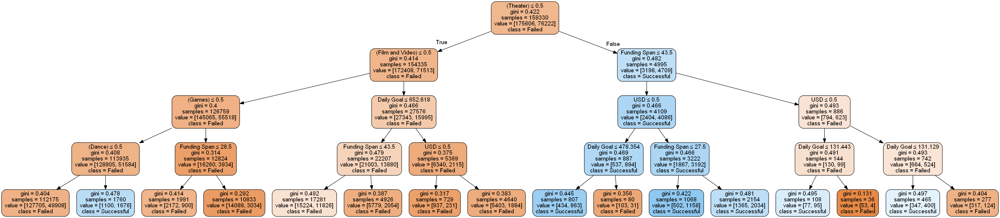

4


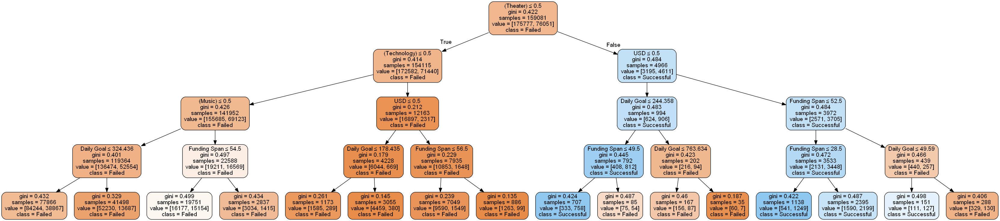

5


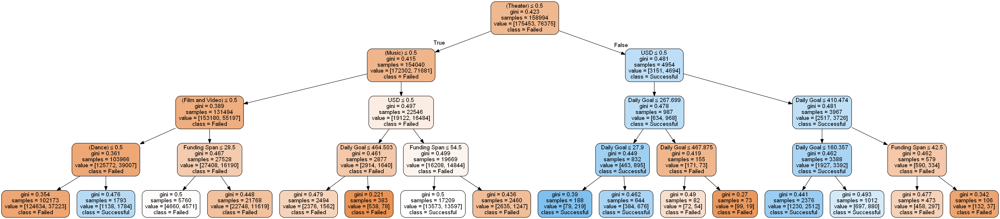

6


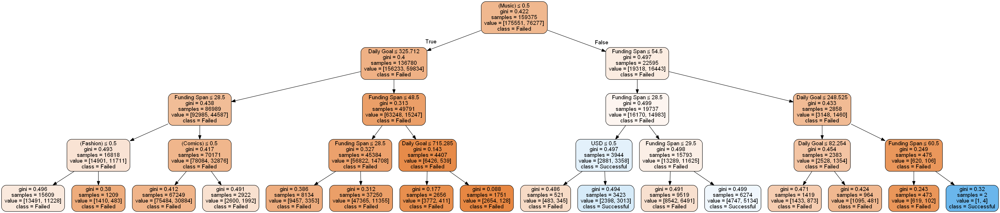

score(Train)= 0.7042738979712585
score(Test)= 0.6492527283479382


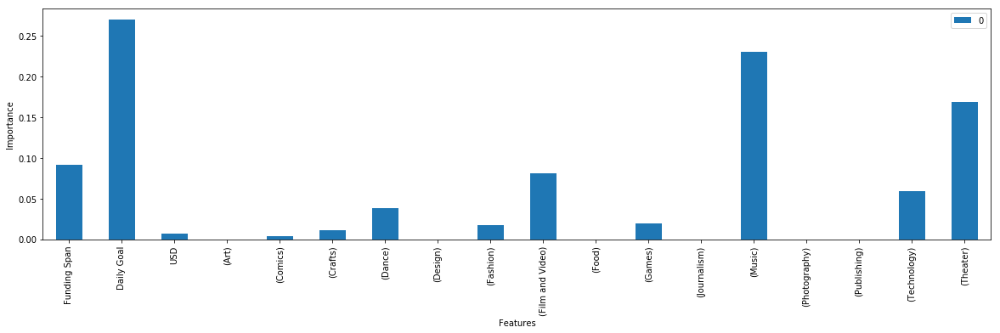

0


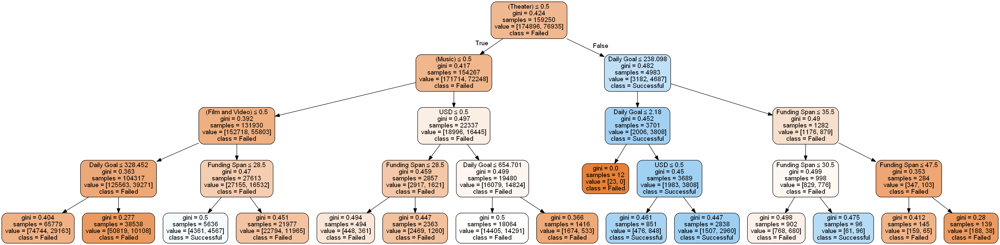

1


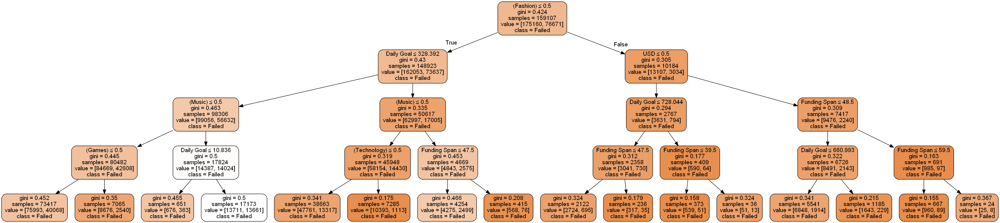

2


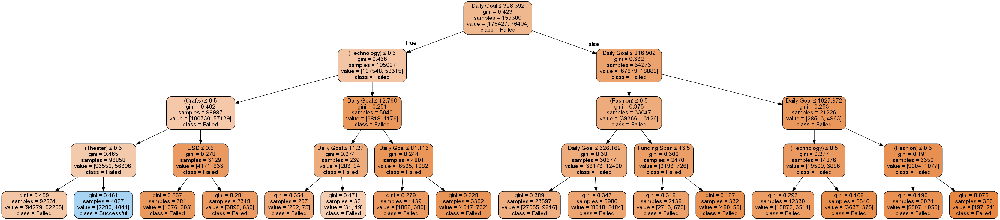

3


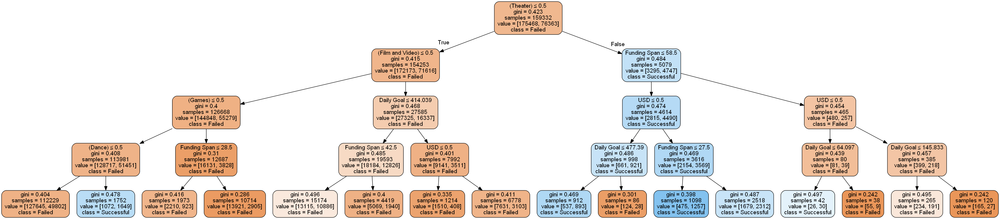

4


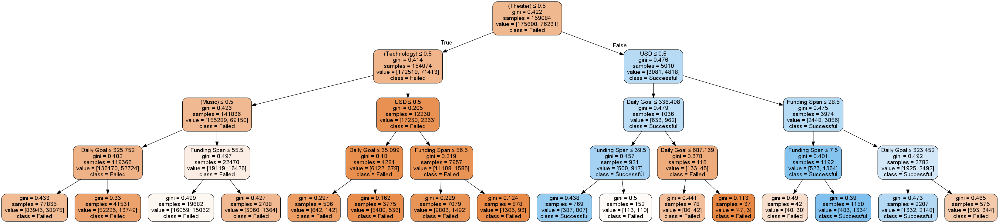

5


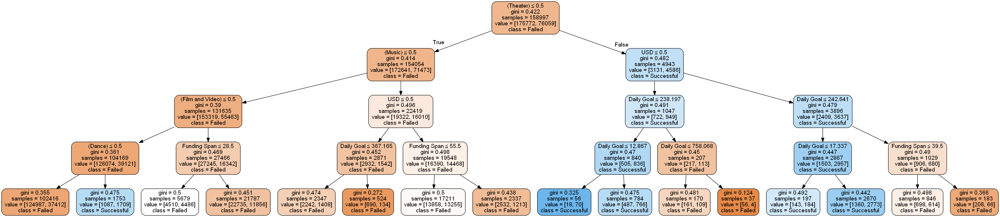

6


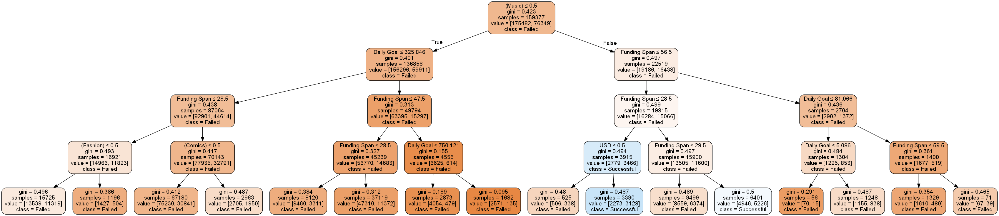

score(Train)= 0.7046839942020928
score(Test)= 0.6484866405031987


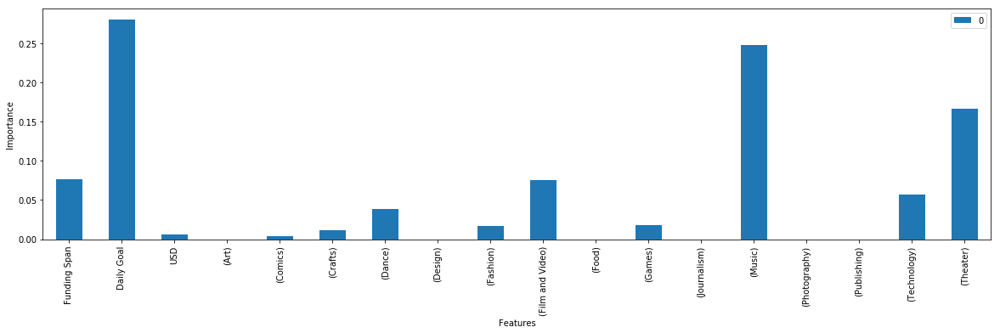

0


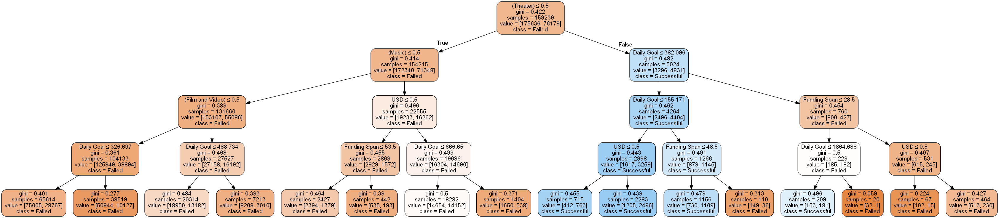

1


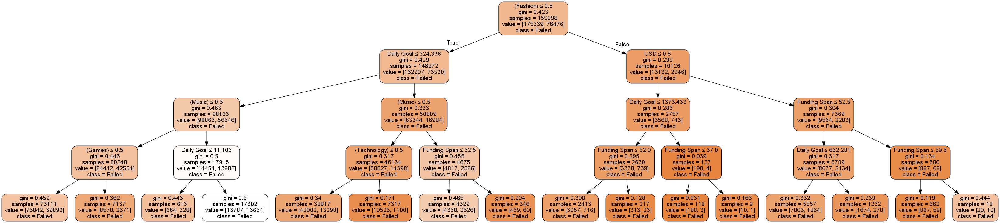

2


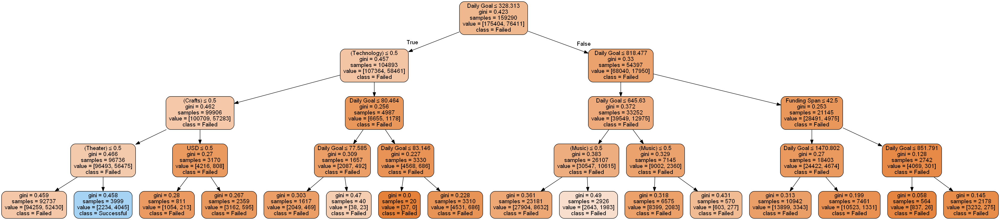

3


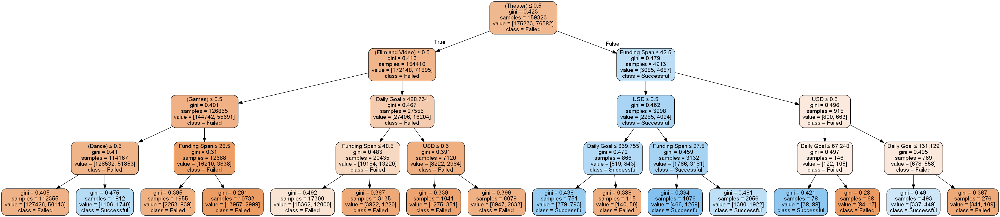

4


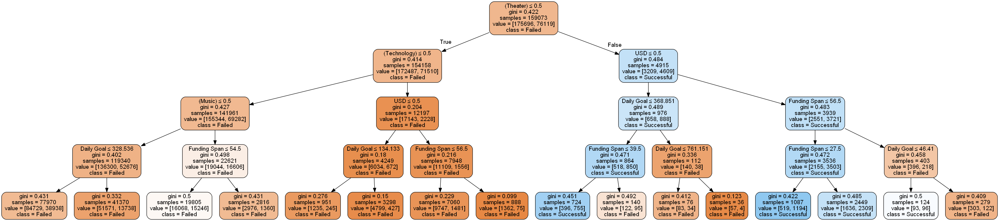

5


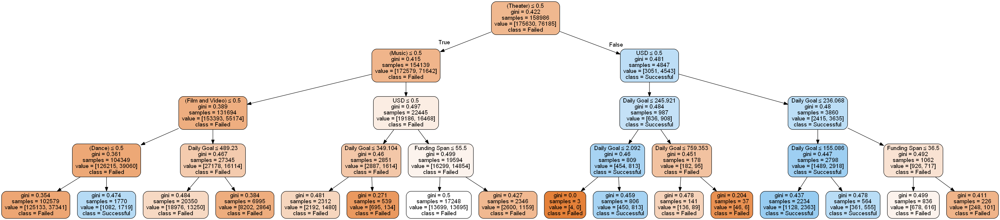

6


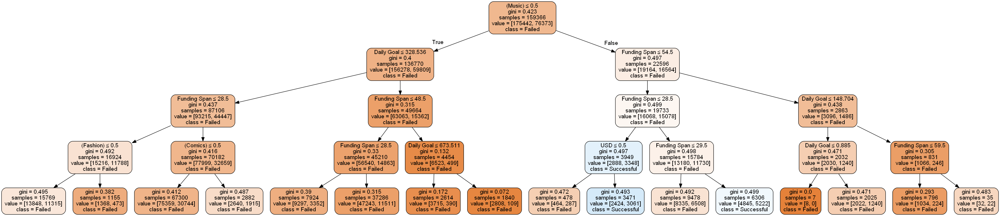

score(Train)= 0.7038163694849291
score(Test)= 0.6505564216977582


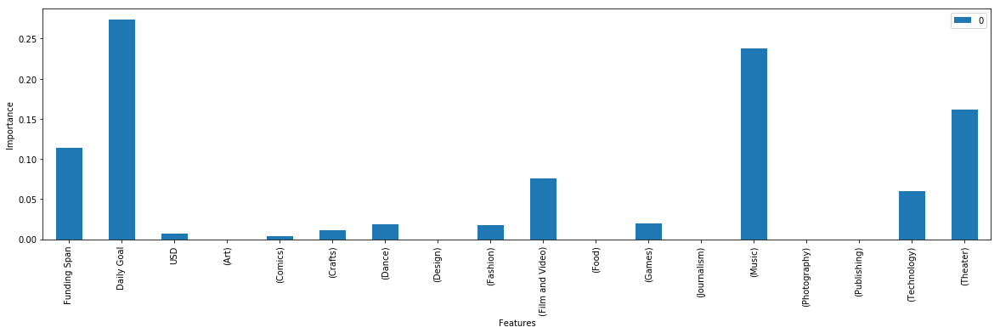

0


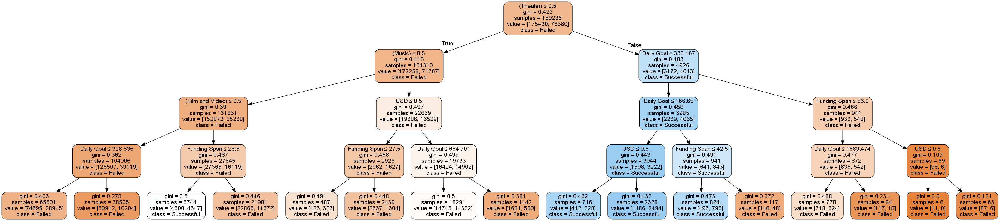

1


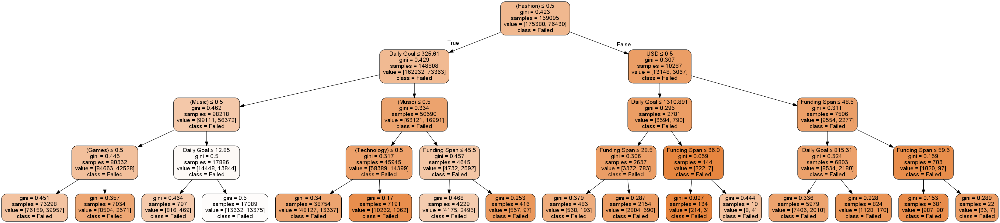

2


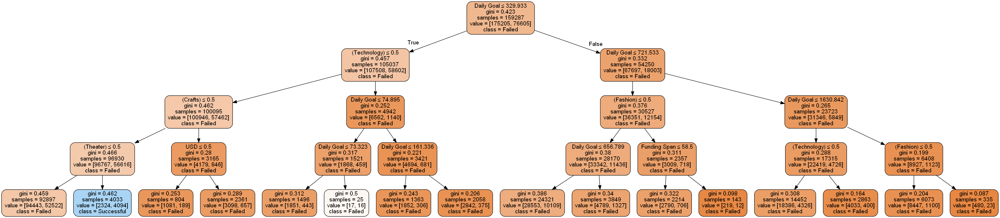

3


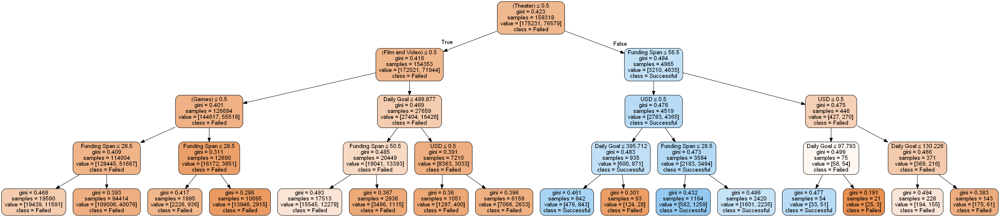

4


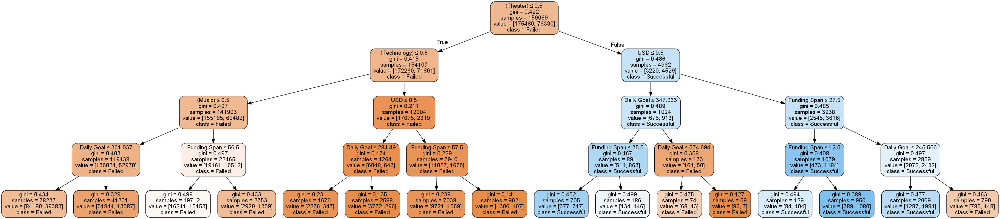

5


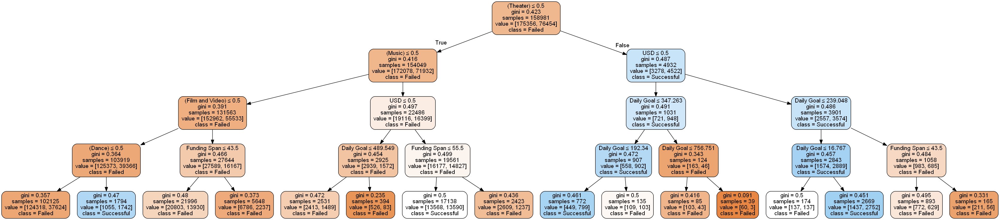

6


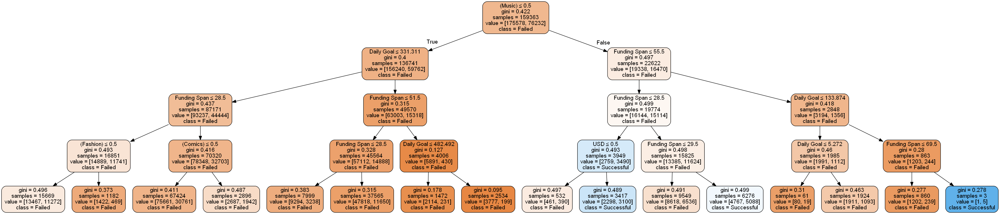

In [9]:
#ツリーモデル

n_split = 5
sum_accuracy = 0
sum_precision = 0
sum_recall = 0
sum_f1_score = 0
split_num = 1

results_fold = np.zeros((n_split, 19))
features_label = ['Funding Span', 'Daily Goal', 'USD', '(Art)', '(Comics)', '(Crafts)', '(Dance)', '(Design)', '(Fashion)', '(Film and Video)', '(Food)', '(Games)', '(Journalism)', '(Music)', '(Photography)', '(Publishing)', '(Technology)', '(Theater)']
lb = LabelBinarizer()
clf = RandomForestClassifier(n_estimators=7, max_depth=4, criterion="gini", min_samples_leaf=2, min_samples_split=2, random_state=1234)

for train_idx, test_idx in KFold(n_splits=n_split, random_state=1234).split(df_deals):
    train_temp = df_deals.loc[train_idx]
    test_temp = df_deals.loc[test_idx]
    #Trainデータのみ外れ値処理
    df_deals_ex_outlier, main_category_onehot, main_category_list = outlier2_remove_func(train_temp)
    
    funding_span_train = df_deals_ex_outlier['funding_span'].values.reshape(-1,1)
    daily_goal_train = df_deals_ex_outlier['daily_goal'].values.reshape(-1,1)
    funding_span_test = test_temp['funding_span'].values.reshape(-1,1)
    daily_goal_test = test_temp['daily_goal'].values.reshape(-1,1)
    
    y_train = df_deals_ex_outlier['state'].values
    X_train = np.c_[funding_span_train, daily_goal_train, df_deals_ex_outlier['currency_usdflag'].values.reshape(-1,1), main_category_onehot]
    y_test = test_temp['state'].values
    main_category_onehot_test = lb.fit_transform(test_temp['main_category'])
    X_test = np.c_[funding_span_test, daily_goal_test, test_temp['currency_usdflag'].values.reshape(-1,1), main_category_onehot_test]
    
    clf.fit(X_train, y_train)
    print("score(Train)=", clf.score(X_train, y_train))
    print("score(Test)=", clf.score(X_test, y_test))
    pd.DataFrame(clf.feature_importances_, index=features_label).plot.bar(figsize=(20,5))
    plt.ylabel("Importance")
    plt.xlabel("Features")
    plt.show()
    
    for i, est in enumerate(clf.estimators_):
        print(i)
        dot_data = StringIO()
        export_graphviz(est, out_file=dot_data, feature_names=features_label, class_names=["Failed","Successful"], filled=True, rounded=True, special_characters=True) 
        graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
        display(Image(graph.create_png()))
